# Phase 2 Project:

**Author**: Jordana Tepper

**Pace**: Live NYC

**Instructor**: Joseph Mata

## Overview

## Business Problem

## Data Understanding

### Imports

In [1]:
# Importing neccesary packages

# Basic imports
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Data visualizations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Pre-Processing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder, PolynomialFeatures

#Modeling
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

### Loading in data

In [2]:
# Loading in data from kc_house_data file which includes information about King County House Sales

kc_house_df = pd.read_csv('data/kc_house_data.csv')
kc_house_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,...,8 Good,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,...,8 Good,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,...,7 Average,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,NONE,...,8 Good,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


### Using .info()

In [3]:
# Looking at the general structure and content of kc_house_df

kc_house_df.info()

# 21 columns and 21597 rows with missing values in 'waterfront', 'view', and 'yr_renovated'

# Datatypes in this DataFrame are int, object, and float

# For the columns with missing values, I will look at what percentage of the column this missing-ness accounts for
# After doing so, I will decide how to deal with the missing data

# 'date' is listed as type object which is likely due to the way that the dates are formatted, 
# but I will further analyze this column to confirm

# It is also interesting that 'sqft_basement' is type object, so I will further explore this column.

# 'zipcode' is of type int, but I know that a zipcode represents a given area and is actually a categorical variable. 
# Therefore, after I train test split, I will use OneHotEncoder create dummy variables for this column.
# Doing so will allow me to use 'zipcode' in my model despite it being a categorical variable.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

### Looking at missing values

In [4]:
# Looking at what percent of the data in 'waterfront' is missing
kc_house_df['waterfront'].isnull().sum()/len(kc_house_df['waterfront'])

# Dropping 11% of the data is a lot, so I will use the 'view' column in our Data Preparation to minimize the number
# of entries that I drop.

# The column 'view' refers to the quality of the view from the house.
# More specifically, if the house has a view of a body of water, 
# the 'view' column will have a value that indicates a quality other than 'NONE' ('NONE' signfies no view)

# Therefore, if a an entry has a value of 'NONE' in 'view',
# I can assume that the value for 'waterfront' should be 'NO'

0.11001527989998611

In [5]:
# Looking at what percent of the data in 'view' is missing
kc_house_df['view'].isnull().sum()/len(kc_house_df['view'])

# Dropping 0.3% of the data will not make an impact on the rest of the data, so I will go ahead and drop the missing
# values from the 'view' column during my Data Preparation

0.0029170718155299346

In [6]:
# Looking at what percent of the data in 'yr_renovated' is missing
kc_house_df['yr_renovated'].isnull().sum()/len(kc_house_df['yr_renovated'])

# Dropping 17.8% of the data is a lot, but there is no other column that can provide me with this missing information,
# and I don't want to assume that missing data means that a house was not renovated.

# (Using 'yr_built' to fill in the missing data in 'yr_renovated' would be based upon the assumption that a missing
# entry means that the house was no renovated)

# Therefore, in conclusion, I'd rather have less (but still a good amount) data that is of higher accuracy 
# than slightly more data that is potentially wrong, so I will drop the missing values from 'yr_renovated' during
# my Data Preparation

0.17789507802009538

### Exploring the DataTypes of certain columns

In [7]:
# Exploring the 'date' column Datatype
print(kc_house_df['date'])
print('\n')
print("A single entry in column 'date' is of'", type(kc_house_df['date'][0]))

# This shows me that the entries in the 'date' column are strings, so during my Data Preparation, 
# I will clean up this column by splitting it into a month column and a year column

# After this, I will also confirm that this data about houses sold in year 2014 - 2015

0        10/13/2014
1         12/9/2014
2         2/25/2015
3         12/9/2014
4         2/18/2015
            ...    
21592     5/21/2014
21593     2/23/2015
21594     6/23/2014
21595     1/16/2015
21596    10/15/2014
Name: date, Length: 21597, dtype: object


A single entry in column 'date' is of' <class 'str'>


In [8]:
# 'sqft_basement' is listed as an object, so I will look at the different values in the 'sqft_basement' column
print('Value Counts')
print(kc_house_df['sqft_basement'].value_counts())
print('\n')

print('Value Counts in Percentages')
print(kc_house_df['sqft_basement'].value_counts(normalize = True))

# I see that there are 454 entries in this column with the value '?' 
# This indicates that there is a placeholder in the 'sqft_basement' column to signify missing values

# Futhermore, when looking at the value counts as percentages, I can see that the '?' placeholders take up only 2.1%
# of the data, so during my data cleaning, it seems safe to drop these rows.

# After I drop these rows, I will convert the rest of the data from this column to floats

Value Counts
0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1135.0        1
915.0         1
2130.0        1
1008.0        1
1852.0        1
Name: sqft_basement, Length: 304, dtype: int64


Value Counts in Percentages
0.0       0.593879
?         0.021021
600.0     0.010048
500.0     0.009677
700.0     0.009631
            ...   
1135.0    0.000046
915.0     0.000046
2130.0    0.000046
1008.0    0.000046
1852.0    0.000046
Name: sqft_basement, Length: 304, dtype: float64


### Using .describe() on the numerical columns

In [9]:
# Deactivating scientific notation
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# Looking at the descriptive statistics for the numerical columns 
# (not including 'sqft_basement' because I haven't dropped the '?' placeholders or changed the other values to flaots)

kc_house_df.describe()

# I see that many columns have outliers:
#  - 'price' has outliers for both the min ($78,000) and max ($7,700,000)

#  - 'bedrooms' has a max outlier (33) which I will probably remove during my Data Preparation

#  - 'bathrooms' has a max outlier (8)

#  - 'sqft_living' has outliers for both the min (370) and max (13,540)

#  - 'sqft_lot' has outliers for both the min (520) and max (1,651,359)

#  - 'sqft_above' has outliers for both the min (370) and max (9,410)

#  - Something interesting about 'yr_renovated' is that the max is 2015 
#    but the min and 25%, 50%, and 75% quartiles are 0.
#    This likely indicates that a value of 0 means that the house has not been renovated, 
#    but I will do further analysis of this.

#  - 'sqft_living15' - which is the square footage of interior housing living space for the nearest 15 neighbors -
#    has outliers for both the min (399) and max (6,210)

#  - 'sqft_lot15' - which is the square footage of the land lots of the nearest 15 neighbors -
#    has outliers for both the min (651) and max (871,200)

# After I clean the 'sqft_basement' column in my Data Preparation, I will repeat the .describe() step

# Furthemore, this information shows me that I will eventually need to use StandardScaler 
# because the values in different columns are not of the same magnitude

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000,17755.00000,21597.00000,21597.00000,21597.00000,21597.00000,21597.00000
mean,4580474287.77099,540296.57351,3.37320,2.11583,2080.32185,15099.40876,1.49410,1788.59684,1970.99968,83.63678,98077.95185,47.56009,-122.21398,1986.62032,12758.28351
std,2876735715.74778,367368.14010,0.92630,0.76898,918.10613,41412.63688,0.53968,827.75976,29.37523,399.94641,53.51307,0.13855,0.14072,685.23047,27274.44195
min,1000102.00000,78000.00000,1.00000,0.50000,370.00000,520.00000,1.00000,370.00000,1900.00000,0.00000,98001.00000,47.15590,-122.51900,399.00000,651.00000
25%,2123049175.00000,322000.00000,3.00000,1.75000,1430.00000,5040.00000,1.00000,1190.00000,1951.00000,0.00000,98033.00000,47.47110,-122.32800,1490.00000,5100.00000
50%,3904930410.00000,450000.00000,3.00000,2.25000,1910.00000,7618.00000,1.50000,1560.00000,1975.00000,0.00000,98065.00000,47.57180,-122.23100,1840.00000,7620.00000
75%,7308900490.00000,645000.00000,4.00000,2.50000,2550.00000,10685.00000,2.00000,2210.00000,1997.00000,0.00000,98118.00000,47.67800,-122.12500,2360.00000,10083.00000
max,9900000190.00000,7700000.00000,33.00000,8.00000,13540.00000,1651359.00000,3.50000,9410.00000,2015.00000,2015.00000,98199.00000,47.77760,-121.31500,6210.00000,871200.00000


### Clarification work after .describe() on the numerical columns

In [10]:
# Examing the 'yr_renovated' column to see if a value of 0 represents no renovation

kc_house_df[['yr_built','yr_renovated']].sort_values(by = 'yr_built').head(30)

# It seems as though a value of 0 signfies no renovations because I can see that there are both NaN values and 0 values
# This means that a value of NaN represents missing data and a value of 0 must mean the absence of renovations

# Note: I included 'yr_built' in this evalutation because I thought that maybe a value of zero 
#       was specifically for newer houses that did not need renovations,
#       but as seen from the data, older homes also have values of 0.

,yr_built,yr_renovated
14069,1900,0.00000
14783,1900,0.00000
10973,1900,0.00000
115,1900,nan
4693,1900,nan
15283,1900,0.00000
8849,1900,1996.00000
18061,1900,0.00000
5231,1900,0.00000
12357,1900,0.00000


### Using .describe() on the categorical columns

In [11]:
# Looking at the descriptive statistics for the categorical columns
# This will include sqft_basement because it is still formatted as an object

kc_house_df.describe(include=[object])

# For each categorical variables, the value with the highest frequency is as follows:
#  - 'date': '6/23/2014'
#  - 'waterfront': 'NO'
#  - 'view': 'NONE'
#  - 'condition': 'Average'
#  - 'grade': '7 Average'
#  - 'sqft_basement': '0.0'

,date,waterfront,view,condition,grade,sqft_basement
count,21597,19221,21534,21597,21597,21597
unique,372,2,5,5,11,304
top,6/23/2014,NO,NONE,Average,7 Average,0.0
freq,142,19075,19422,14020,8974,12826


### Clarification work after .describe() on the categorical columns

In [12]:
# According to the table above, grade has 11 distinct values, so I will take a look at those
print(kc_house_df['grade'].value_counts())

# Looking further at the 'Luxury' and 'Mansion' values
kc_house_df.groupby('grade')['price'].mean().sort_values(ascending = False)

# Based on this data, I am going to drop '13 Mansion' and '12 Luxury' during my Data Preparation.

# I am choosing to do this because while '13 Mansion' and '12 Luxury' are present in only 102 of the entries, 
# I think that, based on the mean prices for these two categories, they will skew the dataset.

# Furthermore, I do not think the average home buyer will be looking at mansions and luxury homes, and therefore,
# these categories are not relevant to my model.

# Also, there is only one house with the grade '3 poor', 
# so I will add it to the '4 low' category in my Data Preparation

7 Average        8974
8 Good           6065
9 Better         2615
6 Low Average    2038
10 Very Good     1134
11 Excellent      399
5 Fair            242
12 Luxury          89
4 Low              27
13 Mansion         13
3 Poor              1
Name: grade, dtype: int64


grade
13 Mansion      3710769.23077
12 Luxury       2202528.08989
11 Excellent    1497792.37845
10 Very Good    1072347.46737
9 Better         773738.22218
8 Good           542986.80000
7 Average        402594.57277
6 Low Average    301916.57066
3 Poor           262000.00000
5 Fair           248523.97107
4 Low            212001.85185
Name: price, dtype: float64

### Correlation table of numerical values

In [13]:
# Looking at the correlations between the variables (target ('price') and numerical predictor variables) 
# which will be useful when I begin my modeling section

kc_house_df.corr()

# 'price' seems to have the highest correaltion with 'sqft_living' out of all the numerical variables

# 'sqft_living' and 'sqft_above' are highly correlated with one another (0.88)

# 'sqft_living' and 'bathrooms' seem to be relatively highly correlated with one another (0.76)


# 'sqft_living' and 'sqft_living15' seem to be relatively highly correlated with one another (0.76)
# Similarly, 'sqft_lot' and 'sqft_lot15' seem to be relatively highly correlated with one another (0.72)

# These are all important correlations that may suggest colinearity 
# and should thus be taken into account during my modeling

# After I do the neccesary data cleaning, I will redo this correlation table as well as a heatmap during my modeling

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.00000,-0.01677,0.00115,0.00516,-0.01224,-0.13191,0.01861,-0.01080,0.02162,-0.01201,-0.00821,-0.00180,0.02067,-0.00270,-0.13856
price,-0.01677,1.00000,0.30879,0.52591,0.70192,0.08988,0.25680,0.60537,0.05395,0.12960,-0.05340,0.30669,0.02204,0.58524,0.08284
bedrooms,0.00115,0.30879,1.00000,0.51451,0.57821,0.03247,0.17794,0.47939,0.15567,0.01849,-0.15409,-0.00995,0.13205,0.39341,0.03069
bathrooms,0.00516,0.52591,0.51451,1.00000,0.75576,0.08837,0.50258,0.68667,0.50717,0.05105,-0.20479,0.02428,0.22490,0.56988,0.08830
sqft_living,-0.01224,0.70192,0.57821,0.75576,1.00000,0.17345,0.35395,0.87645,0.31815,0.05566,-0.19980,0.05216,0.24121,0.75640,0.18434
sqft_lot,-0.13191,0.08988,0.03247,0.08837,0.17345,1.00000,-0.00481,0.18414,0.05295,0.00451,-0.12959,-0.08551,0.23023,0.14476,0.71820
floors,0.01861,0.25680,0.17794,0.50258,0.35395,-0.00481,1.00000,0.52399,0.48919,0.00354,-0.05954,0.04924,0.12594,0.28010,-0.01072
sqft_above,-0.01080,0.60537,0.47939,0.68667,0.87645,0.18414,0.52399,1.00000,0.42404,0.02214,-0.26157,-0.00120,0.34484,0.73177,0.19508
yr_built,0.02162,0.05395,0.15567,0.50717,0.31815,0.05295,0.48919,0.42404,1.00000,-0.22521,-0.34721,-0.14837,0.40999,0.32638,0.07078
yr_renovated,-0.01201,0.12960,0.01849,0.05105,0.05566,0.00451,0.00354,0.02214,-0.22521,1.00000,0.06985,0.03215,-0.07216,-0.00025,0.00385


## Data Preparation

### Dropping the missing values in 'view'

In [14]:
# Dropping the missing values from 'view'
kc_house_df.dropna(subset = ['view'], axis = 0, inplace = True)
kc_house_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21534 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21534 non-null  int64  
 1   date           21534 non-null  object 
 2   price          21534 non-null  float64
 3   bedrooms       21534 non-null  int64  
 4   bathrooms      21534 non-null  float64
 5   sqft_living    21534 non-null  int64  
 6   sqft_lot       21534 non-null  int64  
 7   floors         21534 non-null  float64
 8   waterfront     19164 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21534 non-null  object 
 11  grade          21534 non-null  object 
 12  sqft_above     21534 non-null  int64  
 13  sqft_basement  21534 non-null  object 
 14  yr_built       21534 non-null  int64  
 15  yr_renovated   17704 non-null  float64
 16  zipcode        21534 non-null  int64  
 17  lat            21534 non-null  float64
 18  long  

### Filling in the missing values from 'waterfront' using the data from 'view'

In [15]:
# When 'view' has a value of 'NONE', assign the corresponding value of 'waterfront' to 'NO' 
# (including those that already have a value of 'NO')

kc_house_df.loc[kc_house_df['view'] == 'NONE', 'waterfront'] = 'NO'

In [16]:
# Checking how many missing values there are in 'waterfront' after this imputation
kc_house_df['waterfront'].isna().sum()/len(kc_house_df['waterfront'])

# I will drop the rest of the missing values in 'waterfront' because they only account for 1.2% of the data

0.012073929599702795

In [17]:
# Dropping the remaining missing values in 'waterfront'
kc_house_df.dropna(subset = ['waterfront'], axis = 0, inplace = True)
kc_house_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21274 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21274 non-null  int64  
 1   date           21274 non-null  object 
 2   price          21274 non-null  float64
 3   bedrooms       21274 non-null  int64  
 4   bathrooms      21274 non-null  float64
 5   sqft_living    21274 non-null  int64  
 6   sqft_lot       21274 non-null  int64  
 7   floors         21274 non-null  float64
 8   waterfront     21274 non-null  object 
 9   view           21274 non-null  object 
 10  condition      21274 non-null  object 
 11  grade          21274 non-null  object 
 12  sqft_above     21274 non-null  int64  
 13  sqft_basement  21274 non-null  object 
 14  yr_built       21274 non-null  int64  
 15  yr_renovated   17493 non-null  float64
 16  zipcode        21274 non-null  int64  
 17  lat            21274 non-null  float64
 18  long  

### Dropping missing values from 'yr_renovated'

In [18]:
# Dropping the missing values from 'yr_renovated'
kc_house_df.dropna(subset = ['yr_renovated'], axis = 0, inplace = True)
kc_house_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17493 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             17493 non-null  int64  
 1   date           17493 non-null  object 
 2   price          17493 non-null  float64
 3   bedrooms       17493 non-null  int64  
 4   bathrooms      17493 non-null  float64
 5   sqft_living    17493 non-null  int64  
 6   sqft_lot       17493 non-null  int64  
 7   floors         17493 non-null  float64
 8   waterfront     17493 non-null  object 
 9   view           17493 non-null  object 
 10  condition      17493 non-null  object 
 11  grade          17493 non-null  object 
 12  sqft_above     17493 non-null  int64  
 13  sqft_basement  17493 non-null  object 
 14  yr_built       17493 non-null  int64  
 15  yr_renovated   17493 non-null  float64
 16  zipcode        17493 non-null  int64  
 17  lat            17493 non-null  float64
 18  long  

### Cleaning the 'date' column

In [19]:
# Making a new column 'month_sold' that includes only the month value from the corresponding 'date' entry

# Splitting the 'date' entries at the '/' to make each entry a list that consists of three values: month, day, year
kc_house_df['month_sold'] = kc_house_df['date'].str.split('/')

# Using .apply so that each entry in the new column 'month_sold' includes only the month in which the house was sold
kc_house_df['month_sold'] = kc_house_df['month_sold'].apply(lambda x : x[0])

In [20]:
# Making a new column 'year_sold' that includes only the year value from the corresponding 'date' entry
# This is a very similar process to making the 'month_sold' column

# Splitting the 'date' entries at the '/' to make each entry a list that consists of three values: month, day, year
kc_house_df['year_sold'] = kc_house_df['date'].str.split('/')

# Using .apply so that each entry in the new column 'year_sold' includes only the year in which the house was sold
kc_house_df['year_sold'] = kc_house_df['year_sold'].apply(lambda x : x[2])

In [21]:
# Confirming for my own understanding that the house sales in the dataset are from the years 2014-2015
print(kc_house_df['year_sold'].min())
print(kc_house_df['year_sold'].max())

2014
2015


In [22]:
# Because I seperated 'date' in month and year, I will drop the 'date' column
kc_house_df.drop(columns = ['date'], inplace = True)

### Cleaning the 'sqft_basement' column

In [23]:
# Reassigning the original DataFrame so that it only includes the entries where 'sqft_basement' does not have a '?'
kc_house_df = kc_house_df.loc[kc_house_df['sqft_basement'] != '?']

In [24]:
# Converting the remaining values in 'sqft_basement' to floats using .apply()
kc_house_df['sqft_basement'] = kc_house_df['sqft_basement'].apply(lambda x : float(x))

In [25]:
# During my Data Understanding, I mentioned that I would repeat the .describe() step 
# after I cleaned the 'sqft_basement' column and converted the remaining values to floats.

# I already examined the outliers from the rest of the numerical columns, so here I will focus on 'sqft_basement'.

kc_house_df.describe()

# sqft_basement has an outlier as its max (4820)

# The fact that the min of 'sqft_basement' is 0 tells me that this value signfies that there is no basement.

# Therefore, I will make a new column called 'basement' with values 1 and 0 
# where 1 means there is a basement and 0 means there is not basement.

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000,17131.00000
mean,4590416961.06252,536565.66067,3.37634,2.11650,2077.14261,15172.34149,1.49533,1788.91997,288.22264,1971.19187,81.33296,98077.51427,47.55960,-122.21286,1983.31849,12773.73989
std,2875969100.33560,364046.53305,0.93122,0.76462,912.38306,41961.30101,0.53859,825.31818,440.37654,29.29859,394.66046,53.40234,0.13868,0.14070,681.14260,27453.25674
min,1000102.00000,80000.00000,1.00000,0.50000,370.00000,520.00000,1.00000,370.00000,0.00000,1900.00000,0.00000,98001.00000,47.15590,-122.51900,399.00000,659.00000
25%,2126059294.50000,320000.00000,3.00000,1.75000,1430.00000,5037.00000,1.00000,1200.00000,0.00000,1952.00000,0.00000,98033.00000,47.46920,-122.32700,1490.00000,5100.00000
50%,3905040040.00000,450000.00000,3.00000,2.25000,1910.00000,7607.00000,1.50000,1560.00000,0.00000,1975.00000,0.00000,98065.00000,47.57140,-122.22800,1840.00000,7620.00000
75%,7334401020.00000,640000.00000,4.00000,2.50000,2540.00000,10624.00000,2.00000,2210.00000,550.00000,1997.00000,0.00000,98117.00000,47.67790,-122.12400,2360.00000,10074.50000
max,9895000040.00000,7700000.00000,33.00000,8.00000,13540.00000,1651359.00000,3.50000,9410.00000,4820.00000,2015.00000,2015.00000,98199.00000,47.77760,-121.31500,6210.00000,871200.00000


In [26]:
# Making the new column 'basement' where 0 means no basement and 1 means yes basement

# When 'sqft_basement' is greater than 0, the value of the new column 'basement' is 1
kc_house_df.loc[kc_house_df['sqft_basement'] > 0, 'basement'] = 1

# When 'sqft_basement' equals 0, the value of the new column 'basement' is 0
kc_house_df.loc[kc_house_df['sqft_basement'] == 0, 'basement'] = 0

# Making the 1's and 0's in the 'basement' column integers instead of floats
kc_house_df['basement'] = kc_house_df['basement'].apply(lambda x: int(x))

### Removing '13 Mansion' and '12 Luxury' from 'grade'

In [27]:
kc_house_df = kc_house_df.loc[kc_house_df['grade'] != '12 Luxury']
kc_house_df = kc_house_df.loc[kc_house_df['grade'] != '13 Mansion']

### Joining '3 Poor' and '4 Low' from 'grade'

In [28]:
kc_house_df.loc[kc_house_df['grade'] == '3 Poor', 'grade'] = '4 Low'

In [29]:
# Confirming that the code above worked
kc_house_df['grade'].value_counts()

7 Average        7155
8 Good           4798
9 Better         2076
6 Low Average    1631
10 Very Good      884
11 Excellent      304
5 Fair            184
4 Low              19
Name: grade, dtype: int64

### Removing all outliers from numerical columns

In [30]:
Q1 = kc_house_df.quantile(0.25)
Q3 = kc_house_df.quantile(0.75)
IQR = Q3 - Q1

In [31]:
print("Old data set shape with Outliers ", kc_house_df.shape)
kc_house_df_out = kc_house_df[~((kc_house_df < (Q1 - 1.5 * IQR)) |(kc_house_df > (Q3 + 1.5 * IQR))).any(axis=1)]
print("New data set shape without Outliers ",kc_house_df_out.shape)

Old data set shape with Outliers  (17051, 23)
New data set shape without Outliers  (13027, 23)


In [32]:
# Renaming kc_house_df_out back to kc_house_df
kc_house_df = kc_house_df_out
kc_house_df.shape

(13027, 23)

## Data Analysis

Before I begin my modeling, I want to visualize some of the trends in the data.

### Visualizing the relationship between Price and zipcode

In [33]:
# HELP
# price_x_zipcode = kc_house_df.groupby('zipcode')['price'].mean()
# price_x_zipcode = pd.DataFrame(price_x_zipcode)
# price_x_zipcode = price_x_zipcode.reset_index()
# price_x_zipcode = price_x_zipcode.rename(columns = {'price': 'Mean Price', 'zipcode': 'Zipcode'})

# fig = px.bar(price_x_zipcode, 'Zipcode', 'Mean Price')
# fig.update_xaxes(tickangle=90, nticks = 70)

### Visualizing the relationship between price and number of floors

In [34]:
# Making a new DataFrame that shows the mean selling price per number of floors
price_x_floors = kc_house_df.groupby('floors')['price'].mean()
price_x_floors = pd.DataFrame(price_x_floors)

# Renaming the columns for clarity
price_x_floors = price_x_floors.rename(columns = {'price': 'Mean Price', 'floors': 'Floors'})
price_x_floors = price_x_floors.rename_axis('Number of Floors')

# Graphing this relationship using a bar graph where x is the number of floors and y is the mean price
fig = px.bar(price_x_floors, price_x_floors.index, 'Mean Price', text = 'Mean Price', 
             title='Mean Selling Price Per Number of Floors', width=900, height = 650)

# Formating the text and color of the graph
fig.update_traces(texttemplate='%{text:.3s}', textposition='outside', marker_color='darksalmon')
fig.update_layout(font=dict(size=13))
fig.show()

### Visualizing the relationship between price and month sold in 2014 - 2015

In [35]:
#HELP
# Making a new DataFrame that shows the mean selling price per month in 2014-2015
# price_x_month_2014 = kc_house_df.loc[kc_house_df['year_sold'] == '2014']
price_x_month = kc_house_df.groupby('month_sold')['price'].mean()
price_x_month = pd.DataFrame(price_x_month)
price_x_month = price_x_month.reset_index()

# Converting the values in month_sold to int so I can order them in the DataFrame
price_x_month['month_sold'] = price_x_month['month_sold'].apply(lambda x: int(x))

# Sorting the month_sold values in descending order
price_x_month = price_x_month.sort_values(by = 'month_sold', ascending = False)

# Renaming the columns for clarity
price_x_month = price_x_month.rename(columns = {'price': 'Mean Price', 'month_sold': 'Month Sold'})

# Setting the index to 'Month Sold'
price_x_month = price_x_month.set_index('Month Sold')

# Graphing this relationship using a bar graph where x is the month and y is the mean price
fig = px.line(price_x_month, price_x_month.index, 'Mean Price', text = 'Mean Price',
                 title='Mean Selling Price Per Month in 2014-2015', width=1000, height = 700)


# Formating the text and color of the graph as well as the y-axis values
fig.update_traces(marker_color='crimson', texttemplate='%{text:.3s}', textposition='bottom center')
fig.update_yaxes(range=[360000, 500000])
fig.update_xaxes(range=[0, 13], tickvals=[1,2,3,4,5,6,7,8,9,10,11,12])
fig.update_layout(font=dict(size=15))
fig.show()

### Visualizing the relationship between price and view quality (Excellent, Good, Average, Fair, None)

In [36]:
# Grouping each view level (Excellent, Good, Average, Fair, None) by mean price
price_x_view = kc_house_df.groupby('view')['price'].mean()

# Making a this series in a DataFrame and sorting by price
price_x_view = pd.DataFrame(price_x_view).sort_values(by = 'price')

# Renaming for clarity
price_x_view = price_x_view.rename(columns = {'price': 'Mean Price'})
price_x_view = price_x_view.rename_axis('View Rating')

# Graphing this relationship using a bar graph where x is the view rating and y is the mean price
fig = px.bar(price_x_view, price_x_view.index, 'Mean Price', text = 'Mean Price', 
             title='Mean Selling Price Per View Rating', width=1000, height = 700)

fig.update_traces(texttemplate='%{text:.3s}', textposition='outside', marker_color='mediumaquamarine')

fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':['EXCELLENT', 'GOOD', 'AVERAGE', 'FAIR', 'NONE']},
                  font=dict(size=13),
                  showlegend = False
     )

In [37]:
# Making a box plot for the relationship between price and view quality 
# because I want to see if any of the differences in prices are influenced by outliers

# Not using mean price because I want to see a distributions of all the values
box_price_x_view = kc_house_df[['view', 'price', 'grade']]

fig = px.box(box_price_x_view, x = 'view', y = 'price')
fig.show()

# This boxplot shows that each view rating category has multiple outliers.
# This is important for me to know when creating my models and is something that I should potentially deal with.

### Visualizing the relationship between price and condition (Very Good, Good, Average, Fair/Poor)

In [38]:
# Looking at the value counts for 'condition'
condition = kc_house_df['condition']
condition.value_counts()

# Because there are signficantly less houses rated as 'Poor' and 'Fair', I will combine these two columns
price_x_condition = kc_house_df[['condition', 'price']]
price_x_condition.loc[(price_x_condition['condition'] == 'Fair')|(price_x_condition['condition'] == 'Poor'), \
                      'condition'] = 'Fair/Poor'

# Grouping each condition level (Very Good, Good, Average, Fair/Poor) by mean price
price_x_condition = price_x_condition.groupby('condition')['price'].mean()

# Making a this series in a DataFrame
price_x_condition = pd.DataFrame(price_x_condition)

# Renaming for clarity
price_x_condition = price_x_condition.rename(columns = {'price': 'Mean Price'})
price_x_condition = price_x_condition.rename_axis('Condition Rating')

# Graphing this relationship using a bar graph where x is the condition rating and y is the mean price
fig = px.bar(price_x_condition, price_x_condition.index, 'Mean Price', text = 'Mean Price', 
             title='Mean Price Per Condition Rating', width=1000, height = 650)

fig.update_traces(texttemplate='%{text:.3s}', textposition='outside', marker_color='cornflowerblue')

fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray':['Fair/Poor', 'Good', 'Average', 'Very Good']},
                  font=dict(size=13),
                  showlegend = False
                  )

### Visualizing the relationship between longitude and latitude and price --> NEED TO FINISH

In [39]:
lat_long_price = kc_house_df[['lat','long','price', 'zipcode']]
#lat_long_price_mean_price = pd.DataFrame(lat_long_price.groupby(['lat', 'long'])['price'].mean())
#lat_long_price_mean_price
px.scatter(lat_long_price, 'long', 'lat', height = 700, color = 'price')


## Modeling

### Train Test Split

In [40]:
# Train test split with 70% of the data in the train data and 30% in the test data

# Target variable is price
y = kc_house_df['price']

# Predictor variables are every variable except price
X = kc_house_df.drop(columns=['price'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [41]:
# Checking the size of the train data and the test data, respectively
print(len(X_train))
print(len(X_test))

9118
3909


### Baseline Model

In [42]:
# Baseline model with only the continuous and discrete numerical values
base  = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 
         'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 
         'sqft_lot15', 'month_sold', 'year_sold']

lr = LinearRegression()

lr.fit(X_train[base], y_train)

LinearRegression()

In [43]:
# Checking the R-squared of my model
lr.score(X_train[base], y_train)

0.6097308275410609

In [44]:
# Checking my model for overfitting
lr.score(X_test[base], y_test)

# Confirmed not overfitting

0.6139748953815405

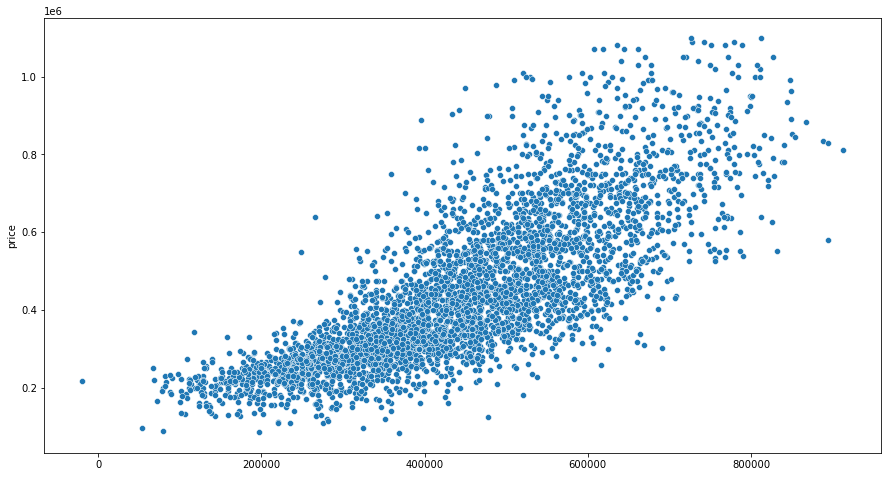

In [45]:
# Creating the y predictions
y_pred = lr.predict(X_test[base])

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred, y_test)

In [46]:
# Looking at errors
MAE = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test, y_pred, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 91398.566965963
Root Mean Square Error = 120640.03662657567


###### Comments about baseline model

An R-squared of 61% is not great and the errors (MAE and RMSE) are too high.

For my next model, I will use One Hot Encoding and Ordinal Coding in order to allow myself to add categorical variables into my model.

I will also use StandardScaler to standardize and scale my X_train and X_test as well as np.log to normalize my y_train.

### Model 2

#### One Hot Encoding

In [47]:
# Using OneHotEncoder to make columns for each category in 'zipcode' and 'waterfront' for both the train and test data
# I specified drop = 'first' to drop the first column as a way to avoid the dummy variable trap.
# The dropped column will become the reference category
onehot_enc = OneHotEncoder(handle_unknown = 'error', drop = 'first', sparse = False)

# Nominal columns from the dataset
nom_col = ['zipcode', 'waterfront', 'month_sold', 'year_sold']

# One Hot Encoding
nom_cats_train = onehot_enc.fit_transform(X_train[nom_col])
nom_cats_test = onehot_enc.transform(X_test[nom_col])

# Assigning the column names of the dummy variables to columns
columns = onehot_enc.get_feature_names_out()

# Turning the One Hot Encoded data into dataframes (one for train, one for test)
nom_cats_train = pd.DataFrame(nom_cats_train, columns = columns)
nom_cats_test = pd.DataFrame(nom_cats_test, columns = columns)

# Concating X_train and nom_cats_train to make one large dataframe and reassigning it to X_train
X_train = pd.concat([X_train.reset_index(), nom_cats_train], axis = 1)

# Concating X_test and nom_cats_test to make one large dataframe and reassigning it to X_test
X_test = pd.concat([X_test.reset_index(), nom_cats_test], axis = 1)

In [48]:
# Because I One Hot Encoded 'zipcode' and 'waterfront', I can drop the original 'zipcode' and 'waterfront' columns
# I'll do this to both the train data and the test data

# Dropping 'zipcode' and 'waterfront' from the train data
X_train.drop(columns = ['zipcode', 'waterfront', 'month_sold', 'year_sold'], inplace = True)

# Dropping 'zipcode' and 'waterfront' from the test data
X_test.drop(columns = ['zipcode', 'waterfront', 'month_sold', 'year_sold'], inplace = True)

# I can also drop 'index' and 'id' because they are not relevent
X_train.drop(columns = ['index', 'id'], inplace = True)
X_test.drop(columns = ['index', 'id'], inplace = True)

#### Ordinal Encoding

In [49]:
# Using Ordinal Encoding to make the values of ordinal variables numerical

# Ordinal columns in the dataset
ord_cat_selector = ['view', 'condition', 'grade']

# Creating the train and test subsets that only include the relevant columns
ord_cat_subset_train = X_train[ord_cat_selector]
ord_cat_subset_test = X_test[ord_cat_selector]

# Correctly ordering the values of the ordinal columns
view_ord = ['NONE', 'FAIR', 'AVERAGE', 'GOOD', 'EXCELLENT']
condition_ord = ['Poor', 'Fair', 'Average', 'Good','Very Good']
grade_ord = ['4 Low', '5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent']

# Defining ord_enc using OrdinalEncoder
ord_enc = OrdinalEncoder(categories = [view_ord, condition_ord, grade_ord])

# Ordinal Encoding
ord_enc.fit_transform(ord_cat_subset_train)
ord_enc.transform(ord_cat_subset_test)

# Turning the Ordinal Encoded data into dataframes (one for train, one for test)
ord_cat_subset_train = pd.DataFrame(ord_enc.transform(ord_cat_subset_train),
                        columns = ord_cat_subset_train.columns)

ord_cat_subset_test = pd.DataFrame(ord_enc.transform(ord_cat_subset_test),
                        columns = ord_cat_subset_test.columns)

# Concating X_train and ord_cat_subset_train to make one large dataframe and reassigning it to X_train
X_train = pd.concat([X_train, ord_cat_subset_train], axis = 1)

# Concating X_test and ord_cat_subset_test to make one large dataframe and reassigning it to X_test
X_test = pd.concat([X_test, ord_cat_subset_test], axis = 1)

In [50]:
#Including only the columns that have numerical values 
#(this is essentially taking out the original 'view', 'condition', and 'grade' columns without dropping them)

X_train = X_train.select_dtypes(include='number')
X_test = X_test.select_dtypes(include='number')

#### Standard Scaling X

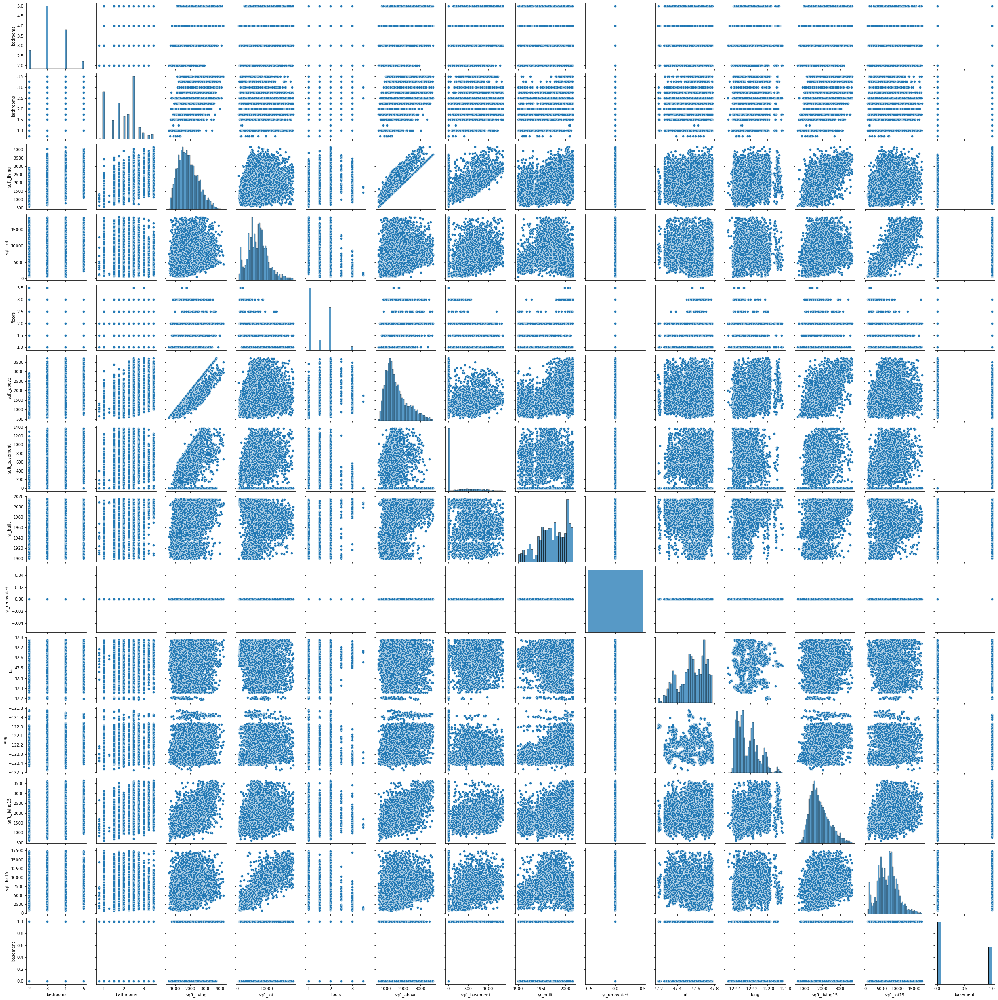

In [51]:
#Looking at the distributions of the X columns that were not encoded
X_train_not_encoded = X_train[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above',
                              'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15',
                              'sqft_lot15', 'basement']]
sns.pairplot(X_train_not_encoded)
plt.show()

In [52]:
# Standard scaling all continuous X_train columns

# Instantiating a new scaler
scaler = StandardScaler()

X_train[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']] \
         = scaler.fit_transform \
           (X_train[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']])

In [53]:
# Standard scaling all continuous X_test columns

X_test[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']] \
         = scaler.transform(X_test[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement',
                                   'sqft_living15', 'sqft_lot15']])

#### Normalizing Y

In [54]:
# Visualizing the y_train to see if I need to normalize the data

fig = px.histogram(x= y_train)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)

# sns.displot(y_train, kde=True)
# plt.show()


# Based on this plot, I will go ahead and normalize the y_train

In [55]:
# Using np.log to normalize y_train
y_train_log = np.log(y_train)

In [56]:
# Confirming that y_train_log is now normalized

fig = px.histogram(x = y_train_log)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)

# plt.figure(figsize=(20,50))
# ax = sns.displot(y_train_log, kde=True)

#### Building Model 2

In [57]:
X_train_2 = X_train
X_test_2 = X_test

In [58]:
lr = LinearRegression()

lr.fit(X_train_2, y_train_log)

LinearRegression()

In [59]:
# Checking the R-squared of Model 2
r_squared = lr.score(X_train_2, y_train_log)
r_squared

0.8554641518849041

In [60]:
# Calculating thr Adjusted R-squared for Model 2 
adj_r2 = 1 - (1-r_squared) * ((len(y)-1)/(len(y)-X_train_2.shape[1]-1))
adj_r2

0.8543685057590316

In [61]:
# Checking for overfitting

#Have to turn y_test into log form to check the score
y_test_log = np.log(y_test)

r_squared_test = lr.score(X_test_2, y_test_log)
r_squared_test

# Confirmed not overfitting

0.8561083253523882

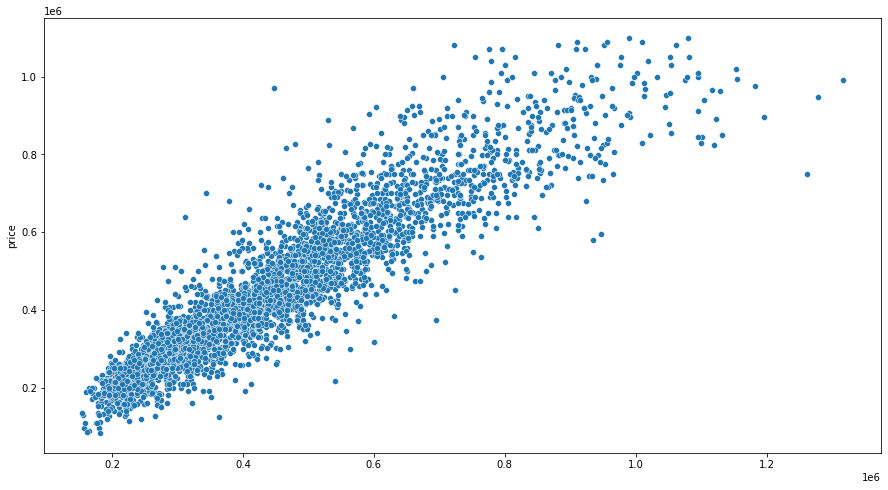

In [62]:
# Creating the y predictions
y_pred = lr.predict(X_test_2)

#Back-transforming the y prediction values since they are in log form and are thus mismatched from the y test values
y_pred = np.exp(y_pred)

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred, y_test)

In [63]:
# Looking at errors
MAE = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test, y_pred, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 52791.9741980704
Root Mean Square Error = 75066.14180546845


##### Comments about Model 2

An R-squared of 85.55% and adjusted R-squared of 85.44% are good, but the errors (MAE and RMSE) are still too high. These values, however, are all better than they were in the baseline model.

Next, I want to see if accounting for multicollinearity will improve both my adjusted R-squared and errors. If this is not the case (i.e. Model 3 is still better), then I will assume that the multicollinearity of the predictor variables is not severe enough to weaken my model.

In [64]:
# Making a correlation table to assess multicolinearity
correlation_table = X_train_2.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# Zip the variable name columns (Which were only named level_0 and level_1 by default) in a new column named "pairs"
correlation_table['pairs'] = list(zip(correlation_table.level_0, correlation_table.level_1))

# Set index to pairs
correlation_table.set_index(['pairs'], inplace = True)

# Drop level columns
correlation_table.drop(columns=['level_1', 'level_0'], inplace = True)

# Rename correlation column as cc rather than 0
correlation_table.columns = ['cc']

# Limiting the correlation table to show the highest correlations - not including those that are equal to 1
correlation_table = correlation_table.loc[(correlation_table['cc']>.7) & (correlation_table['cc'] <1)]

# Dropping duplicates
correlation_table.drop_duplicates(inplace = True)

correlation_table

,cc
pairs,
"(sqft_lot, sqft_lot15)",0.87702
"(basement, sqft_basement)",0.85590
"(sqft_above, sqft_living)",0.84224
"(sqft_living, sqft_living15)",0.74491
"(sqft_above, sqft_living15)",0.72100


The correlation table shows me that I should drop one variable from each of the pairs to avoid multicollinearity in the next model **(Model 3)**:

**'sqft_lot' vs. sqft_lot15'**: 'sqft_lot' represents the total square footage of the lot of house. 'sqft_lot_15' represents the avaerage square footage of the lots of houses of nearest 15 neighbors. When thinking about which of these two is more important to the goal of my model, 'sqft_lot' is the clear answer. Therefore, I will drop 'sqft_lot15'

**'basement' vs. 'sqft_basement'**: I will drop 'basement' because 'sqft_basement' can provide more information than 'basement' from just one column. Not only does 'sqft_basement" include the size of the basement, but it also implies whether or not a house has a basement.

**'sqft_above' vs. 'sqft_living'**: I will drop 'sqft_above' because, as mentioned, 'sqft_living' represents the square footage of the whole house, whereas 'sqft_above' represents the square footage of the house apart from the basement. In other words, keeping 'sqft_living' simplifies the model because it can provide more information than 'sqft_above' from just one column.

**'sqft_living' vs. 'sqft_living15'**: Similarly to the case with 'sqft_lot' vs. 'sqft_lot15', it seems more appropriate to drop 'sqft_living15'


**'sqft_above' vs. 'sqft_living15'**: I will be dropping both of these columns based on the other pairings above.


_Alternate Changes_: After creating a model with such variables, I will make another model **(Model 4)** in which I instead drop 'sqft_living' and keep 'sqft_above'. In this alternate model, I will still be dropping 'basement', 'sqft_living15', and 'sqft_lot15'.


### Model 3

In [65]:
# Dropping the columns mentioned above

X_train_3 = X_train.drop(columns = ['sqft_above', 'basement', 'sqft_living15', 'sqft_lot15'])
X_test_3 = X_test.drop(columns = ['sqft_above', 'basement', 'sqft_living15', 'sqft_lot15'])

In [66]:
# In addition to dropping the columns mentioned above, an additional edit that I would 
# like to do at this point in my modeling is to make a boolean column in both X_train_3 and X_test_3
# called 'renovation'where a value of 1 means that the house has been renovated and 
# a value of 0 means that the house has not been renovated

X_train_3.loc[X_train_3['yr_renovated'] == 0, 'renovations'] = 0
X_train_3.loc[X_train_3['yr_renovated'] != 0, 'renovations'] = 1

X_test_3.loc[X_test_3['yr_renovated'] == 0, 'renovations'] = 0
X_test_3.loc[X_test_3['yr_renovated'] != 0, 'renovations'] = 1


# Now dropping 'yr_renovated' because I made the new 'renovations' column
X_train_3 = X_train_3.drop(columns = ['yr_renovated'])
X_test_3 = X_test_3.drop(columns = ['yr_renovated'])

In [67]:
lr = LinearRegression()

lr.fit(X_train_3, y_train_log)

LinearRegression()

In [68]:
# Checking the R-squared of Model 3
r_squared = lr.score(X_train_3, y_train_log)
r_squared

0.8509449597720405

In [69]:
# Calculating thr Adjusted R-squared for Model 3 
adj_r2 = 1 - (1-r_squared) * ((len(y)-1)/(len(y)-X_train_3.shape[1]-1))
adj_r2

0.8498615098972008

In [70]:
# Checking for overfitting

#Have to turn y_test into log form to check the score
y_test_log = np.log(y_test)

r_squared = lr.score(X_test_3, y_test_log)
r_squared

# Confirmed not overfit

0.851953749697584

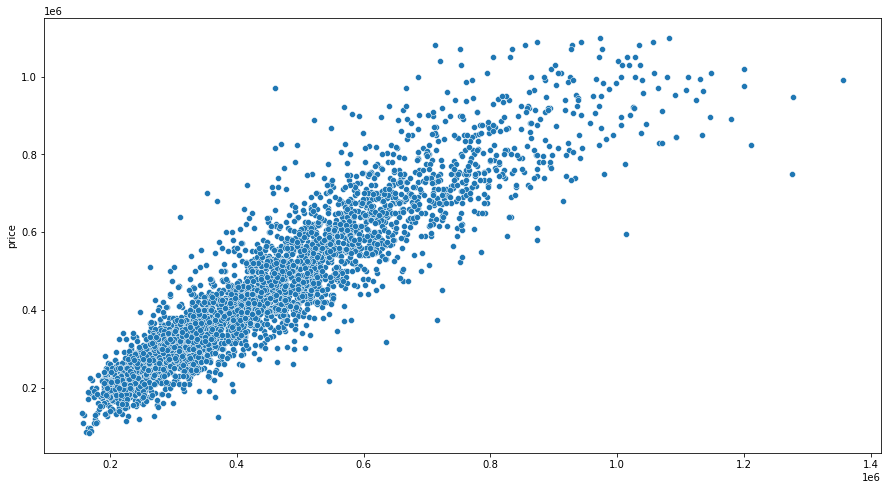

In [71]:
# Creating the y predictions
y_pred = lr.predict(X_test_3)

#Back-transforming the y prediction values since they are in log form and are thus mismatched from the y test values
y_pred = np.exp(y_pred)

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred, y_test)

In [72]:
# Looking at errors
MAE = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test, y_pred, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 53909.12355533806
Root Mean Square Error = 76564.6576676939


##### Comments about Model 3

The adjusted R-squared for this model is 85% which is slightly less than the previous model

Similarly, the errors (MAE and RMSE) increased compared to the previous model.

This tells me that the changes I made for Model 3 were not necessarily effective in minimizing error and maximized the adjusted R-squared value.

### Model 4

In [73]:
# For this model, I will do the alternate model that I had mentioned previously
# I will drop 'sqft_living' instead of 'sqft_above'
# I will still drop 'basement', 'sqft_living15', and 'sqft_lot15' like I did in model 3

# Dropping the mentioned columns
X_train_4 = X_train.drop(columns = ['sqft_living' ,'sqft_living15', 'sqft_lot15', 'basement'])
X_test_4 = X_test.drop(columns = ['sqft_living', 'sqft_living15', 'sqft_lot15', 'basement'])

In [74]:
# As I did in model 3, I will make a boolean column in both X_train_4 and X_test_4
# called 'renovation'where a value of 1 means that the house has been renovated and 
# a value of 0 means that the house has not been renovated

X_train_4.loc[X_train_4['yr_renovated'] == 0, 'renovations'] = 0
X_train_4.loc[X_train_4['yr_renovated'] != 0, 'renovations'] = 1

X_test_4.loc[X_test_4['yr_renovated'] == 0, 'renovations'] = 0
X_test_4.loc[X_test_4['yr_renovated'] != 0, 'renovations'] = 1


# Now dropping 'yr_renovated' because I made the new 'renovations' column
X_train_4 = X_train_4.drop(columns = ['yr_renovated'])
X_test_4 = X_test_4.drop(columns = ['yr_renovated'])

In [75]:
lr = LinearRegression()

lr.fit(X_train_4, y_train_log)

LinearRegression()

In [76]:
# Checking the R-squared of Model 4
r_squared = lr.score(X_train_4, y_train_log)
r_squared

0.8509449597720407

In [77]:
# Calculating thr Adjusted R-squared for Model 4
adj_r2 = 1 - (1-r_squared) * ((len(y)-1)/(len(y)-X_train_4.shape[1]-1))
adj_r2

0.8498615098972009

In [78]:
# Checking for overfitting

#Have to turn y_test into log form to check the score
y_test_log = np.log(y_test)

r_squared = lr.score(X_test_4, y_test_log)
r_squared

# Confirmed not overfit

0.8519537496975835

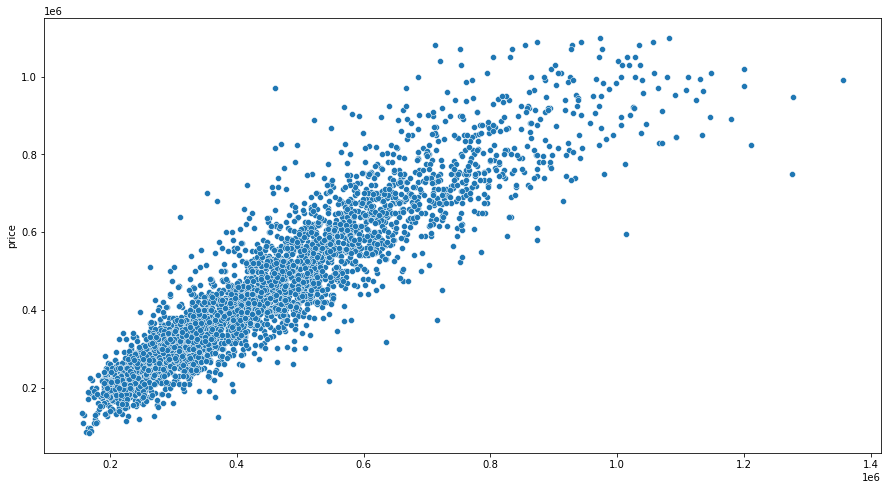

In [79]:
# Creating the y predictions
y_pred = lr.predict(X_test_4)

#Back-transforming the y prediction values since they are in log form and are thus mismatched from the y test values
y_pred = np.exp(y_pred)

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred, y_test)

In [80]:
# Looking at errors
MAE = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test, y_pred, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 53909.12355533817
Root Mean Square Error = 76564.65766769528


##### Comments about Model 4

Interestingly, the adjusted R-squared for this model is essentially the same as that of Model 3. When rounded, both models have an adjusted R-squared of 85%.

Also, the differences in errors (both MAE and RMSE) between Model 3 and Model 4 are trivial as the values round to the same number in both models.

Nevertheless, the model with the highest adjusted R-squared and the lowest errors is Model 2 (Adj. R-Squared = 85.44%, MAE = 52791.97, RMSE = 75066.14)

This the multicollinearity of the predictor variables in Model 2 was not severe enough to weaken my model.

Therefore, for my next model I will build upon Model 2.

### Model 5 - Built based on Model 2

In [81]:
# Setting X_train_5 and X_test_5 equal to X_train_2 and X_test_2, respectively
X_train_5 = X_train_2
X_test_5 = X_test_2

In [82]:
# Using Polynomial Features to get all the interactions between predictor variables
poly = PolynomialFeatures(2, include_bias = False)

# # Adding these interactions to the original X_train_5 and X_test_5 DataFrames
X_train_5 = pd.DataFrame(poly.fit_transform(X_train_5), columns = poly.get_feature_names_out())
X_test_5 = pd.DataFrame(poly.transform(X_test_5), columns = poly.get_feature_names_out())

In [83]:
# Creating new DataFrames that only include the interactions
X_train_5_interactions = X_train_5.iloc[:, 98:]
X_test_5_interactions = X_test_5.iloc[:, 98:]

In [84]:
# Fitting just X_train_5_interactions rather than X_train_5 solely so I can see the coefficients of these interactions
# and determine which are the strongest

lr = LinearRegression()

lr.fit(X_train_5_interactions, y_train_log)

LinearRegression()

In [85]:
# Checking the coefficients of just the interactions
model_5_coefs = lr.coef_

# Highest coefficients (strongest interactions)
model_5_coefs_w_labels_strongest = sorted(list(zip(model_5_coefs, X_train_5_interactions.columns)), 
                                          reverse = True)[0:20]
model_5_coefs_w_labels_strongest

# 'bedrooms' x 'sqft_living' has the highest coefficient by far, so I will only include this interaction in my model
# I will also add 'sqft_above yr_built' and 'sqft_basement yr_built' because these values are also high

[(311249.20763463597, 'bedrooms sqft_living'),
 (42199.41025745479, 'sqft_above yr_built'),
 (23984.95063816574, 'sqft_basement yr_built'),
 (6719.04252646857, 'bedrooms zipcode_98024'),
 (6579.620265426264, 'zipcode_98014 month_sold_5'),
 (6501.938256246705, 'zipcode_98024 month_sold_8'),
 (5975.635414347346, 'sqft_lot15 zipcode_98024'),
 (5473.969369239328, 'bathrooms sqft_above'),
 (5365.606162617306, 'bedrooms zipcode_98014'),
 (4428.575226370421, 'sqft_living15 zipcode_98014'),
 (3199.1584214042477, 'zipcode_98014 month_sold_9'),
 (3111.268604032249, 'bathrooms sqft_basement'),
 (2734.382325956387, 'sqft_living long'),
 (2322.8238423166026, 'bedrooms zipcode_98039'),
 (2201.195183394189, 'zipcode_98024 grade'),
 (2195.311787195085, 'bedrooms zipcode_98077'),
 (2115.341292716604, 'zipcode_98014 grade'),
 (1995.3719658111022, 'zipcode_98010 condition'),
 (1695.9206744454657, 'zipcode_98024 month_sold_6'),
 (1679.548217322489, 'zipcode_98024 month_sold_5')]

In [86]:
X_train_5.iloc[:, 100:]
X_test_5.iloc[:, 100:]

#'bedroom sqft_living' is at column index 100

,bedrooms sqft_living,bedrooms sqft_lot,bedrooms floors,bedrooms sqft_above,bedrooms sqft_basement,bedrooms yr_built,bedrooms yr_renovated,bedrooms lat,bedrooms long,bedrooms sqft_living15,...,year_sold_2015^2,year_sold_2015 view,year_sold_2015 condition,year_sold_2015 grade,view^2,view condition,view grade,condition^2,condition grade,grade^2
0,-1.09291,-1.72862,3.00000,-2.31252,2.10294,3856.00000,0.00000,94.97140,-244.40000,-1.99936,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,2.00000,1.00000
1,4.95881,7.01064,5.00000,-0.51343,9.82237,9855.00000,0.00000,237.84800,-610.63500,6.87632,...,1.00000,0.00000,3.00000,4.00000,0.00000,0.00000,0.00000,9.00000,12.00000,16.00000
2,-2.07737,-2.65603,4.00000,-1.36902,-1.32773,4010.00000,0.00000,94.70020,-244.04000,-1.96225,...,1.00000,0.00000,2.00000,2.00000,0.00000,0.00000,0.00000,4.00000,4.00000,4.00000
3,4.26739,-2.69769,6.00000,5.49446,-1.99160,6027.00000,0.00000,143.20440,-365.89800,0.28506,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
4,-3.90054,2.93778,3.00000,-2.85551,-1.99160,5907.00000,0.00000,142.13700,-366.87000,-1.10651,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,6.00000,9.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3904,3.85207,9.25061,6.00000,5.06989,-1.99160,5991.00000,0.00000,142.96200,-366.26400,9.85906,...,0.00000,0.00000,0.00000,0.00000,9.00000,6.00000,18.00000,4.00000,12.00000,36.00000
3905,4.64386,0.78031,4.00000,0.53275,7.41523,7908.00000,0.00000,190.26360,-488.35600,3.12611,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
3906,3.02143,-2.86014,6.00000,4.22074,-1.99160,6021.00000,0.00000,143.09610,-366.28800,3.79182,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
3907,-3.16220,3.98533,3.00000,-2.10071,-1.99160,5880.00000,0.00000,142.26330,-366.87000,-1.60747,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,6.00000,9.00000


In [87]:
# Dropping all the interaction columns from X_train_5 except for 'bedrooms sqft_living'

# # Dropping all columns after index 100
X_train_5 = X_train_5.iloc[:, :101]
X_test_5 = X_test_5.iloc[:, :101]

# # Dropping columns between index 97 and index 100 (i.e. dropping 'bedrooms^2' and 'bedrooms bathrooms')
X_train_5 = X_train_5.drop(columns = ['bedrooms^2','bedrooms bathrooms'])
X_test_5 = X_test_5.drop(columns = ['bedrooms^2','bedrooms bathrooms'])

In [88]:
# Adding 'sqft_above yr_built' to both X_train_5 and X_test_5
X_train_5['sqft_above yr_built'] = X_train_5['sqft_above'] * X_train_5['yr_built']
X_test_5['sqft_above yr_built'] = X_test_5['sqft_above'] * X_test_5['yr_built']

# Adding 'sqft_basement yr_built' to both X_train_5 and X_test_5
X_train_5['sqft_basement yr_built'] = X_train_5['sqft_basement'] * X_train_5['yr_built']
X_test_5['sqft_basement yr_built'] = X_test_5['sqft_basement'] * X_test_5['yr_built']

In [89]:
# I am also going to drop 'sqft_basement' as the zeros for the absence of a basement is likely skewing the data,
# and I will keep the boolean 'basement' column that I made earlier

X_train_5 = X_train_5.drop(columns = ['sqft_basement'])
X_test_5 = X_test_5.drop(columns =['sqft_basement'])

In [90]:
# Similarly, I will also drop 'yr_renovated' as the zeros for no renovation is likely skewing the data
# As I did with models 4 and 5, I will make a boolean 'renovations' column 'where a value of 1 means that 
# the house has been renovated and a value of 0 means that the house has not been renovated

X_train_5.loc[X_train_5['yr_renovated'] == 0, 'renovations'] = 0
X_train_5.loc[X_train_5['yr_renovated'] != 0, 'renovations'] = 1

X_test_5.loc[X_test_5['yr_renovated'] == 0, 'renovations'] = 0
X_test_5.loc[X_test_5['yr_renovated'] != 0, 'renovations'] = 1


# Dropping 'yr_renovated' because it is redundant with the 'renovated' column
X_train_5 = X_train_5.drop(columns = ['yr_renovated'])
X_test_5 = X_test_5.drop(columns = ['yr_renovated'])

In [91]:
# Now fitting my X_train_5 model

lr.fit(X_train_5, y_train_log)

LinearRegression()

In [92]:
# Checking the R-squared of Model 5
r_squared = lr.score(X_train_5, y_train_log)
r_squared

0.857779029145852

In [93]:
# Calculating the Adjusted R-squared for Model 5
adj_r2 = 1 - (1-r_squared) * ((len(y)-1)/(len(y)-X_train_5.shape[1]-1))
adj_r2

0.8566787585992471

In [94]:
# Checking for overfitting

#Have to turn y_test into log form to check the score
y_test_log = np.log(y_test)

r_squared = lr.score(X_test_5, y_test_log)
r_squared

# Confirmed not overfit

0.8584837574675331

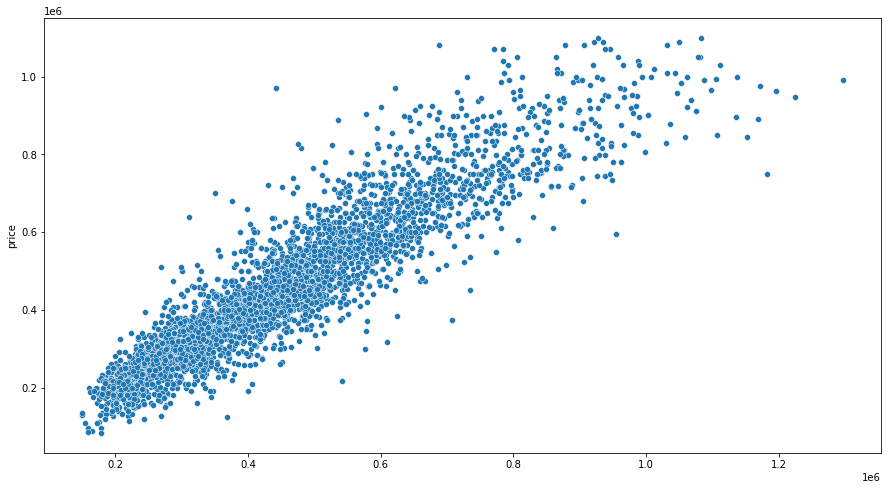

In [95]:
# Creating the y predictions
y_pred_5 = lr.predict(X_test_5)

#Back-transforming the y prediction values since they are in log form and are thus mismatched from the y test values
y_pred_5 = np.exp(y_pred_5)

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred_5, y_test)

In [96]:
# Looking at errors
MAE = mean_absolute_error(y_test, y_pred_5)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test, y_pred_5, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 52224.05900004176
Root Mean Square Error = 74017.02821655544


##### Comments about Model 5

The adjusted R-squared for this model is 85.67% which is higher than all the previous models.

Similarly, the errors in this models are the lower than all the other models (MAE = 52224.06, RMSE = 74017.03).

This will likely be my final model, but I want to explore one more idea.

### Model 6

I will redo train test split and do the same One Hot Encoding and Ordinal Encoding, but I will not One Hot Encode 'zipcode' and then do everything as I did in Model 5.

In [97]:
# Train test split with 70% of the data in the train data and 30% in the test data

# Target variable is price
y = kc_house_df['price']

# Predictor variables are every variable except price
X = kc_house_df.drop(columns=['price'])

X_train_6, X_test_6, y_train_6, y_test_6 = train_test_split(X, y, test_size=0.3, random_state = 42)

In [98]:
# Checking the size of the train data and the test data, respectively
print(len(X_train_6))
print(len(X_test_6))

9118
3909


In [99]:
# Using OneHotEncoder to make columns for each category in 'zipcode' and 'waterfront' for both the train and test data
# I specified drop = 'first' to drop the first column as a way to avoid the dummy variable trap.
# The dropped column will become the reference category
onehot_enc = OneHotEncoder(handle_unknown = 'error', drop = 'first', sparse = False)

# Nominal columns from the dataset
nom_col = ['waterfront', 'month_sold', 'year_sold']

# One Hot Encoding
nom_cats_train = onehot_enc.fit_transform(X_train_6[nom_col])
nom_cats_test = onehot_enc.transform(X_test_6[nom_col])

# Assigning the column names of the dummy variables to columns
columns = onehot_enc.get_feature_names_out()

# Turning the One Hot Encoded data into dataframes (one for train, one for test)
nom_cats_train = pd.DataFrame(nom_cats_train, columns = columns)
nom_cats_test = pd.DataFrame(nom_cats_test, columns = columns)

# Concating X_train and nom_cats_train to make one large dataframe and reassigning it to X_train
X_train_6 = pd.concat([X_train_6.reset_index(), nom_cats_train], axis = 1)

# Concating X_test and nom_cats_test to make one large dataframe and reassigning it to X_test
X_test_6 = pd.concat([X_test_6.reset_index(), nom_cats_test], axis = 1)

In [100]:
# Because I One Hot Encoded 'zipcode' and 'waterfront', I can drop the original 'zipcode' and 'waterfront' columns
# I'll do this to both the train data and the test data

# Dropping 'zipcode' and 'waterfront' from the train data
X_train_6.drop(columns = ['waterfront', 'month_sold', 'year_sold'], inplace = True)

# Dropping 'zipcode' and 'waterfront' from the test data
X_test_6.drop(columns = ['waterfront', 'month_sold', 'year_sold'], inplace = True)

# I can also drop 'index' and 'id' because they are not relevent
X_train_6.drop(columns = ['index', 'id'], inplace = True)
X_test_6.drop(columns = ['index', 'id'], inplace = True)

In [101]:
# Using Ordinal Encoding to make the values of ordinal variables numerical

# Ordinal columns in the dataset
ord_cat_selector = ['view', 'condition', 'grade']

# Creating the train and test subsets that only include the relevant columns
ord_cat_subset_train = X_train_6[ord_cat_selector]
ord_cat_subset_test = X_test_6[ord_cat_selector]

# Correctly ordering the values of the ordinal columns
view_ord = ['NONE', 'FAIR', 'AVERAGE', 'GOOD', 'EXCELLENT']
condition_ord = ['Poor', 'Fair', 'Average', 'Good','Very Good']
grade_ord = ['4 Low', '5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent']

# Defining ord_enc using OrdinalEncoder
ord_enc = OrdinalEncoder(categories = [view_ord, condition_ord, grade_ord])

# Ordinal Encoding
ord_enc.fit_transform(ord_cat_subset_train)
ord_enc.transform(ord_cat_subset_test)

# Turning the Ordinal Encoded data into dataframes (one for train, one for test)
ord_cat_subset_train = pd.DataFrame(ord_enc.transform(ord_cat_subset_train),
                        columns = ord_cat_subset_train.columns)

ord_cat_subset_test = pd.DataFrame(ord_enc.transform(ord_cat_subset_test),
                        columns = ord_cat_subset_test.columns)

# Concating X_train and ord_cat_subset_train to make one large dataframe and reassigning it to X_train
X_train_6 = pd.concat([X_train_6, ord_cat_subset_train], axis = 1)

# Concating X_test and ord_cat_subset_test to make one large dataframe and reassigning it to X_test
X_test_6 = pd.concat([X_test_6, ord_cat_subset_test], axis = 1)

In [102]:
#Including only the columns that have numerical values 
#(this is essentially taking out the original 'view', 'condition', and 'grade' columns without dropping them)

X_train_6 = X_train_6.select_dtypes(include='number')
X_test_6 = X_test_6.select_dtypes(include='number')

In [103]:
# Standard scaling all continuous X_train_6 columns

# Instantiating a new scaler
scaler = StandardScaler()

X_train_6[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']] \
        = scaler.fit_transform \
            (X_train_6[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']])

In [104]:
# Standard scaling all continuous X_test columns

X_test_6[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15']] \
        = scaler.transform(X_test_6[['sqft_living','sqft_lot', 'sqft_above', 'sqft_basement',
                                   'sqft_living15', 'sqft_lot15']])

In [105]:
# Using np.log to normalize y_train
y_train_log_6 = np.log(y_train)

In [106]:
# Using Polynomial Features to get all the interactions between predictor variables
poly = PolynomialFeatures(2, include_bias = False)

# Adding these interactions to the original X_train_5 and X_test_5 DataFrames
X_train_6 = pd.DataFrame(poly.fit_transform(X_train_6), columns = poly.get_feature_names_out())
X_test_6 = pd.DataFrame(poly.transform(X_test_6), columns = poly.get_feature_names_out())

In [107]:
# Creating new DataFrames that only include the interactions
X_train_6_interactions = X_train_6.iloc[:, 31:]
X_test_6_interactions = X_test_6.iloc[:, 31:]

In [108]:
# Fitting just X_train_6_interactions rather than X_train_6 solely so I can see the coefficients of these interactions
# and determine which are the strongest

lr = LinearRegression()

lr.fit(X_train_6_interactions, y_train_log_6)

LinearRegression()

In [109]:
###### Checking the coefficients of just the interactions
model_6_coefs = lr.coef_

# Highest coefficients (strongest interactions)
model_6_coefs_w_labels_strongest = sorted(list(zip(model_6_coefs, X_train_6_interactions.columns)), 
                                          reverse = True)[0:10]
model_6_coefs_w_labels_strongest

# 'bedrooms' x 'sqft_living' has the highest coefficient by far, so I will only include this interaction in my model

[(16206.442514107128, 'bedrooms sqft_living'),
 (687.9187094847857, 'sqft_living zipcode'),
 (536.8104863865832, 'bedrooms yr_renovated'),
 (238.07147510443573, 'bathrooms sqft_living'),
 (21.088503082157107, 'month_sold_8^2'),
 (15.842579300096247, 'sqft_above yr_built'),
 (13.283876333187353, 'month_sold_7^2'),
 (9.00420511690254, 'sqft_basement yr_built'),
 (8.358546335255804, 'month_sold_10^2'),
 (8.003605893369405, 'waterfront_YES grade')]

In [110]:
X_train_6.iloc[:, 33:]
X_test_6.iloc[:, 33:]

#'bedroom sqft_living' is at column index 33

,bedrooms sqft_living,bedrooms sqft_lot,bedrooms floors,bedrooms sqft_above,bedrooms sqft_basement,bedrooms yr_built,bedrooms yr_renovated,bedrooms zipcode,bedrooms lat,bedrooms long,...,year_sold_2015^2,year_sold_2015 view,year_sold_2015 condition,year_sold_2015 grade,view^2,view condition,view grade,condition^2,condition grade,grade^2
0,-1.09291,-1.72862,3.00000,-2.31252,2.10294,3856.00000,0.00000,196110.00000,94.97140,-244.40000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,2.00000,1.00000
1,4.95881,7.01064,5.00000,-0.51343,9.82237,9855.00000,0.00000,490030.00000,237.84800,-610.63500,...,1.00000,0.00000,3.00000,4.00000,0.00000,0.00000,0.00000,9.00000,12.00000,16.00000
2,-2.07737,-2.65603,4.00000,-1.36902,-1.32773,4010.00000,0.00000,196076.00000,94.70020,-244.04000,...,1.00000,0.00000,2.00000,2.00000,0.00000,0.00000,0.00000,4.00000,4.00000,4.00000
3,4.26739,-2.69769,6.00000,5.49446,-1.99160,6027.00000,0.00000,294057.00000,143.20440,-365.89800,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
4,-3.90054,2.93778,3.00000,-2.85551,-1.99160,5907.00000,0.00000,294096.00000,142.13700,-366.87000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,6.00000,9.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3904,3.85207,9.25061,6.00000,5.06989,-1.99160,5991.00000,0.00000,294222.00000,142.96200,-366.26400,...,0.00000,0.00000,0.00000,0.00000,9.00000,6.00000,18.00000,4.00000,12.00000,36.00000
3905,4.64386,0.78031,4.00000,0.53275,7.41523,7908.00000,0.00000,392108.00000,190.26360,-488.35600,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
3906,3.02143,-2.86014,6.00000,4.22074,-1.99160,6021.00000,0.00000,294156.00000,143.09610,-366.28800,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,8.00000,16.00000
3907,-3.16220,3.98533,3.00000,-2.10071,-1.99160,5880.00000,0.00000,294594.00000,142.26330,-366.87000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,4.00000,6.00000,9.00000


In [111]:
# Dropping all the interaction columns from X_train_6 except for 'bedrooms sqft_living'

# Dropping all columns after index 33
X_train_6 = X_train_6.iloc[:, :34]
X_test_6 = X_test_6.iloc[:, :34]

# Dropping columns between index  and 31 index 33 (i.e. dropping 'bedrooms^2' and 'bedrooms bathrooms')
X_train_6 = X_train_6.drop(columns = ['bedrooms^2','bedrooms bathrooms'])
X_test_6 = X_test_6.drop(columns = ['bedrooms^2','bedrooms bathrooms'])

In [112]:
# I am also going to drop 'sqft_basement' as the zeros for the absence of a basement is likely skewing the data,
# and I will keep the boolean 'basement' column that I made earlier

X_train_6 = X_train_6.drop(columns = ['sqft_basement'])
X_test_6 = X_test_6.drop(columns =['sqft_basement'])

In [113]:
# Similarly, I will also drop 'yr_renovated' as the zeros for no renovation is likely skewing the data
# As I did with models 4 and 5, I will make a boolean 'renovations' column 'where a value of 1 means that 
# the house has been renovated and a value of 0 means that the house has not been renovated

X_train_6.loc[X_train_6['yr_renovated'] == 0, 'renovations'] = 0
X_train_6.loc[X_train_6['yr_renovated'] != 0, 'renovations'] = 1

X_test_6.loc[X_test_6['yr_renovated'] == 0, 'renovations'] = 0
X_test_6.loc[X_test_6['yr_renovated'] != 0, 'renovations'] = 1


# Now dropping 'yr_renovated' because I made the new 'renovations' column
X_train_6 = X_train_6.drop(columns = ['yr_renovated'])
X_test_6 = X_test_6.drop(columns = ['yr_renovated'])

In [114]:
# Now fitting my X_train_6 model

lr.fit(X_train_6, y_train_log_6)

LinearRegression()

In [115]:
# Checking the R-squared of Model 6
r_squared = lr.score(X_train_6, y_train_log_6)
r_squared

0.7240206889147007

In [116]:
# Calculating the Adjusted R-squared for Model 6
adj_r2 = 1 - (1-r_squared) * ((len(y)-1)/(len(y)-X_train_6.shape[1]-1))
adj_r2

0.7233623311891413

In [117]:
# Checking for overfitting

#Have to turn y_test into log form to check the score
y_test_log_6 = np.log(y_test_6)

r_squared = lr.score(X_test_6, y_test_log_6)
r_squared

# Confirmed not overfit

0.7349791449964415

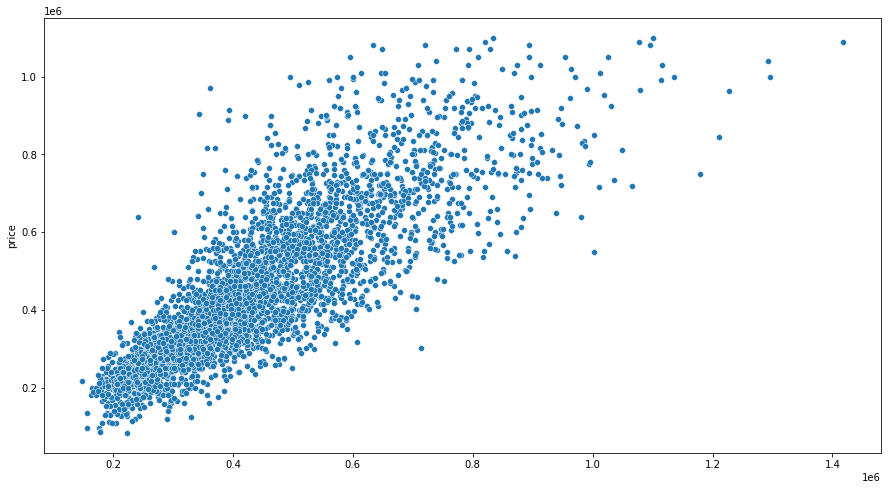

In [118]:
# Creating the y predictions
y_pred_6 = lr.predict(X_test_6)

#Back-transforming the y prediction values since they are in log form and are thus mismatched from the y test values
y_pred_6 = np.exp(y_pred_6)

# Plotting the y predictions against the y test
plt.figure(figsize=(15,8))
ax = sns.scatterplot(y_pred_6, y_test_6)

In [119]:
# Looking at errors
MAE = mean_absolute_error(y_test_6, y_pred_6)
print('Mean Absolute Error =', MAE)

RMSE = mean_squared_error(y_test_6, y_pred_6, squared = False)
print('Root Mean Square Error =', RMSE)

Mean Absolute Error = 77690.84926403085
Root Mean Square Error = 108126.59157047242


##### Comments on Model 6

The adjusted R-Squared is 72.33%

The errors are 77690.85 (MAE) and 108126.59 (RMSE)

Therefore, the decision to not One Hot Encoding 'zipcode' resulted in a weaker model than when it was encoded.

This tells me that I should stick to Model 5.

## Regression Results of Final Model: Model 5

In [120]:
lr = LinearRegression()

lr.fit(X_train_5, y_train_log)

y_train_5_preds = lr.predict(X_train_5)
y_test_5_preds = lr.predict(X_test_5)

#y_train_5_preds is in log form
#y_test_5_preds is in log form
#y_train_log is in log form
#y_test was never in log form

### Plotting predictions vs. training

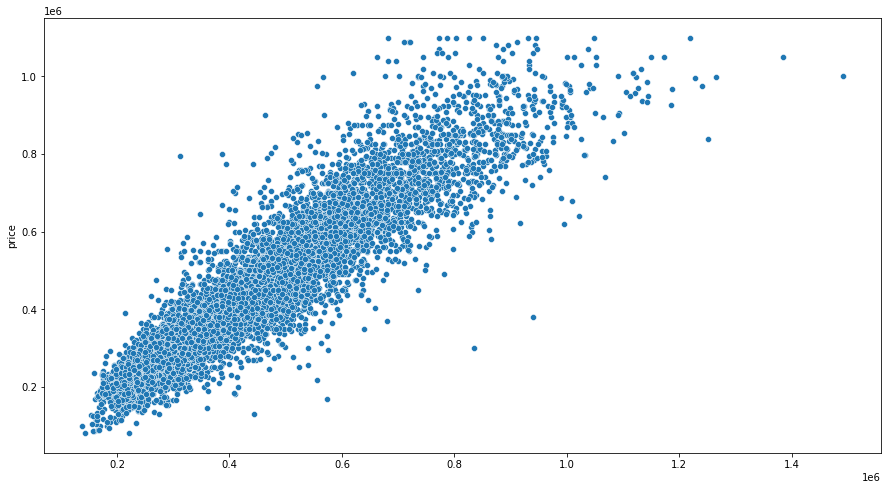

In [121]:
#Need to convert y_train_5_preds and y_train_log back to the original form

plt.figure(figsize=(15,8))
ax = sns.scatterplot(np.exp(y_train_5_preds), np.exp(y_train_log))

<AxesSubplot:ylabel='price'>

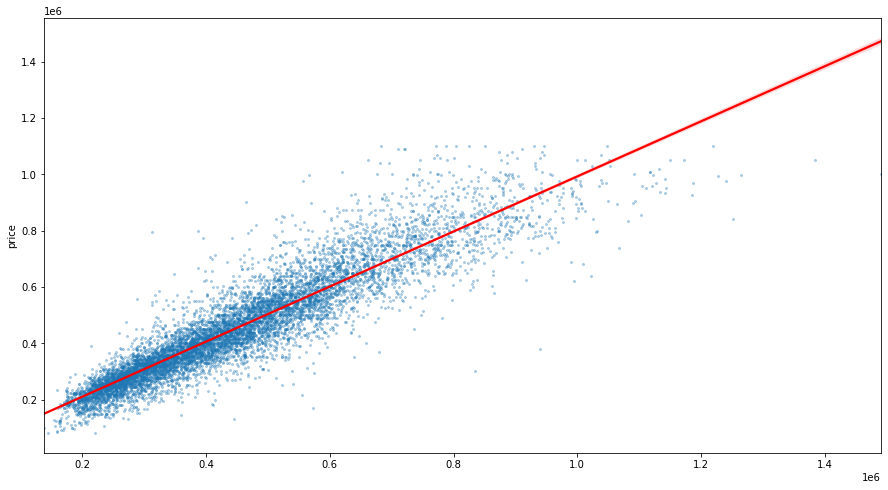

In [122]:
fig, ax = plt.subplots(figsize=(15, 8))
sns.regplot(ax = ax, 
            x = np.exp(y_train_5_preds), 
            y = np.exp(y_train_log),
            scatter_kws={'s':4, 'alpha': 0.3},
            line_kws={"color": "red"})

### Plotting predictions vs. test

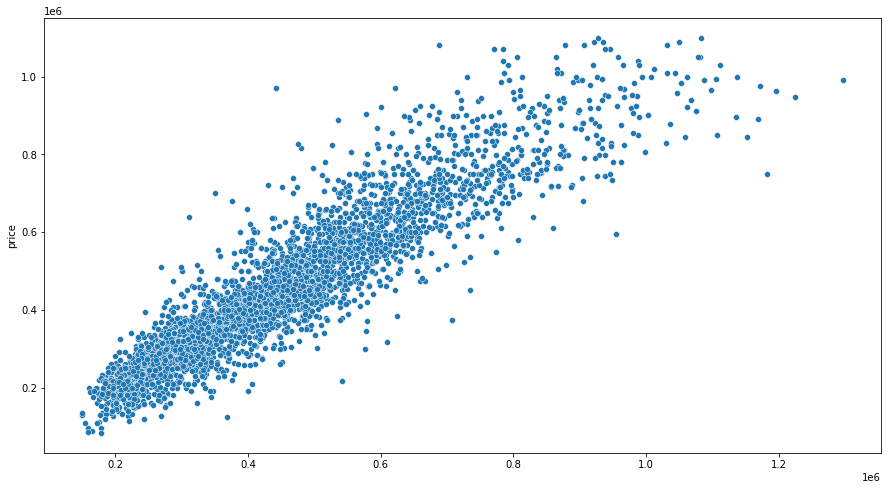

In [123]:
#Need to convert y_test_5_preds back to the original form

plt.figure(figsize=(15,8))
ax = sns.scatterplot(np.exp(y_test_5_preds), y_test)


<AxesSubplot:ylabel='price'>

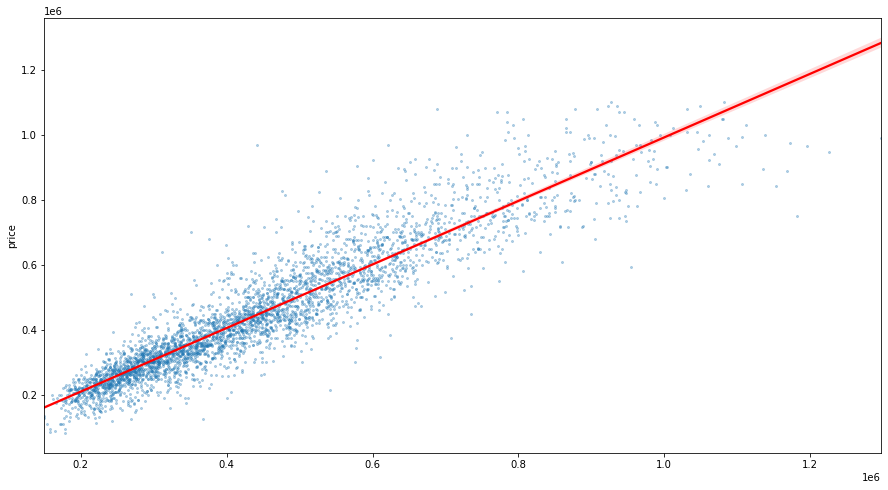

In [124]:
fig, ax = plt.subplots(figsize=(15, 8))
sns.regplot(ax = ax, 
            x = np.exp(y_test_5_preds), 
            y = y_test,
            scatter_kws={'s':4, 'alpha': 0.3},
            line_kws={"color": "red"})

### Comparing errors for test data and train data

#### Train Data Errors

In [125]:
#Need to convert y_train and y_train_5_preds back to the original form

train_MAE = mean_absolute_error(np.exp(y_train_log), np.exp(y_train_5_preds))
print('Mean Absolute Error =', train_MAE)

train_RMSE = mean_squared_error(np.exp(y_train_log), np.exp(y_train_5_preds), squared = False)
print('Root Mean Square Error =', train_RMSE)

Mean Absolute Error = 51895.64212236143
Root Mean Square Error = 73868.34935754056


#### Test Data Errors

In [126]:
#Need to convert y_test_5_preds back to the original form

test_MAE = mean_absolute_error(y_test, np.exp(y_test_5_preds))
print('Mean Absolute Error =', test_MAE)

test_RMSE = mean_squared_error(y_test, np.exp(y_test_5_preds), squared = False)
print('Root Mean Square Error =', test_RMSE)

Mean Absolute Error = 52224.05900004176
Root Mean Square Error = 74017.02821655544


#### Difference in Errors

In [127]:
print('Difference in MAE for Train and Test Data: ', abs(train_MAE - test_MAE))
print('Difference in RMSE for Train and Test Data: ', abs(train_RMSE - test_RMSE))

Difference in MAE for Train and Test Data:  328.41687768032716
Difference in RMSE for Train and Test Data:  148.67885901487898


### Plotting train residuals

In [128]:
#Need to convert y_train_5_preds and y_train_log back to the original form

train_5_residuals = np.exp(y_train_5_preds) - np.exp(y_train_log) 


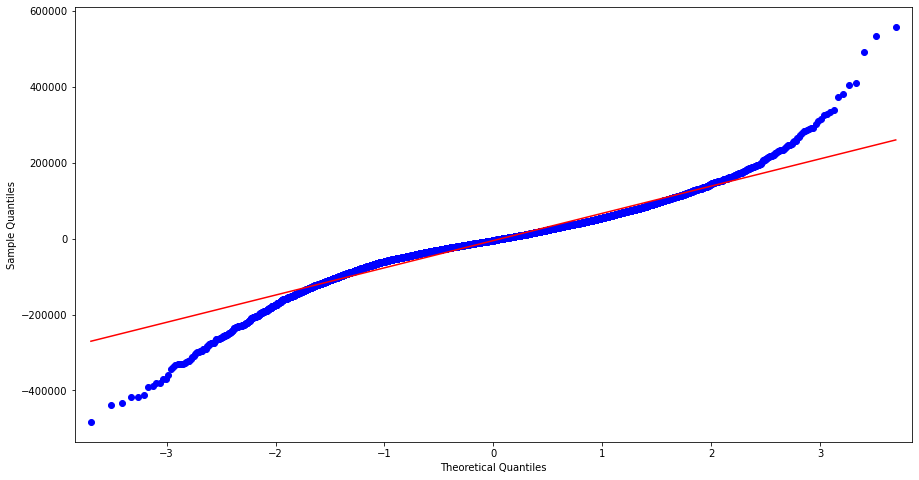

In [129]:
import statsmodels.api as sm

fig, ax = plt.subplots(figsize=(15,8))

fig = sm.qqplot(train_5_residuals, line = 'r', ax = ax)

<AxesSubplot:ylabel='price'>

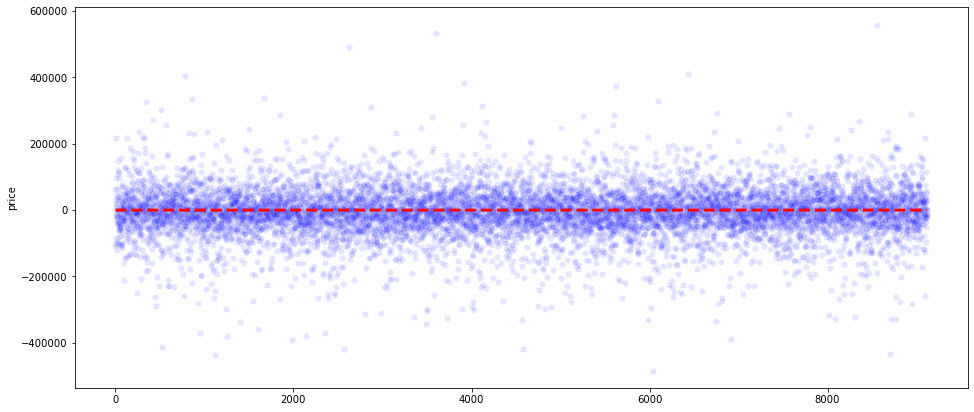

In [130]:
fig, ax = plt.subplots(1, figsize=(16, 7))

sns.scatterplot(ax = ax, x = range(y_train_log.shape[0]), y = train_5_residuals, alpha=0.1, color= "blue")

sns.lineplot(ax = ax, x=range(y_train_log.shape[0]), y = 0, color='red', linestyle="dashed", linewidth = 3)

### Plotting test residuals

In [131]:
# Need to convert y_test_5_preds back to the original form
test_5_residuals = np.exp(y_test_5_preds) - y_test

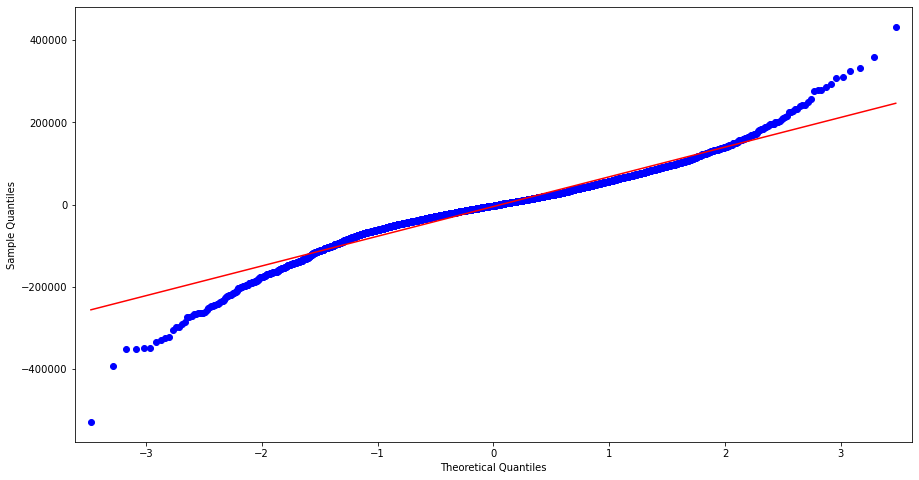

In [132]:
fig, ax = plt.subplots(figsize=(15,8))

fig = sm.qqplot(test_5_residuals, line = 'r', ax = ax)

<AxesSubplot:ylabel='price'>

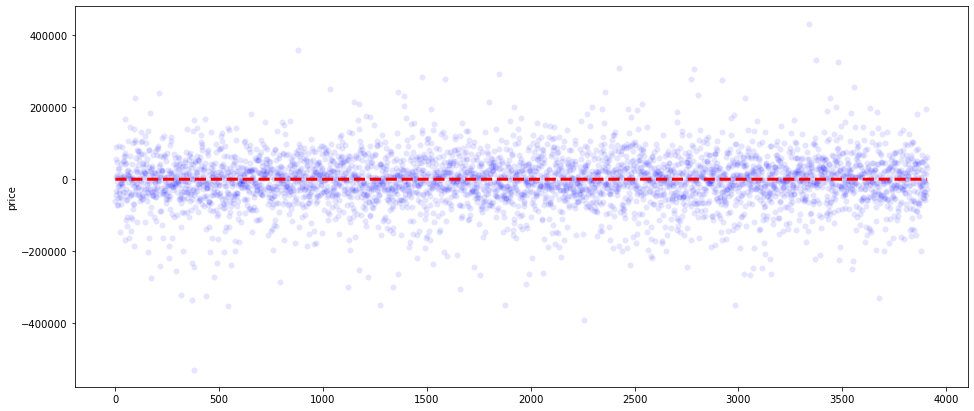

In [133]:
fig, ax = plt.subplots(1, figsize=(16, 7))

sns.scatterplot(ax = ax, x = range(y_test.shape[0]), y = test_5_residuals, alpha=0.1, color= "blue")

sns.lineplot(ax = ax, x=range(y_test.shape[0]), y = 0, color='red', linestyle="dashed", linewidth = 3)

### Plotting test and train residuals together

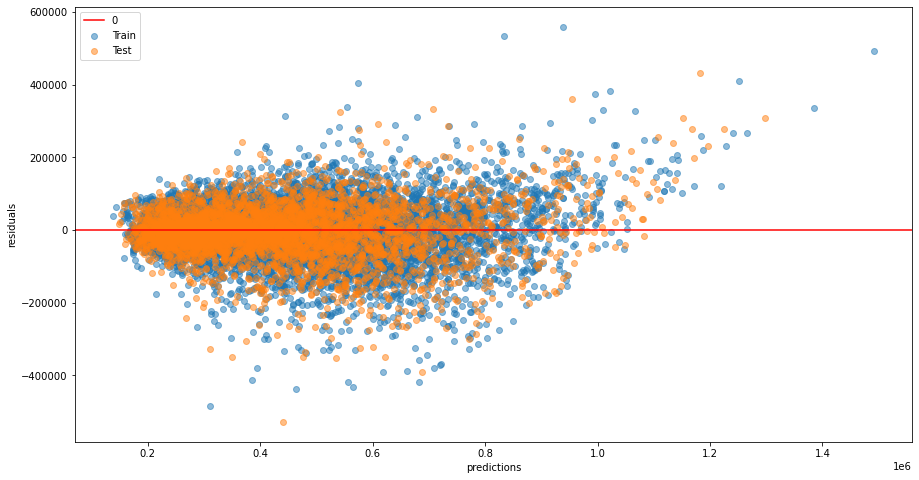

In [134]:
plt.figure(figsize=(15,8))

ax = plt.scatter(np.exp(y_train_5_preds), train_5_residuals, label='Train', alpha = 0.5)
ax = plt.scatter(np.exp(y_test_5_preds), test_5_residuals, label='Test', alpha = 0.5 )

plt.axhline(y=0, color = 'red', label = '0')
plt.xlabel('predictions')
plt.ylabel('residuals')
plt.legend()
plt.show()

### Checking for normal distribution of train residuals

In [135]:
fig = px.histogram(x = train_5_residuals)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)

#training residuals appear normal

### Checking for normal distribution of test residuals

In [136]:
fig = px.histogram(x = test_5_residuals)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)

#testing residuals appear normal

### Testing the model using an example input from the test data

In [137]:
examp_idx = 10
single_examp = X_test_5.iloc[examp_idx].values
X_test.iloc[examp_idx]

bedrooms          2.00000
bathrooms         1.50000
sqft_living      -1.02330
sqft_lot         -1.68075
floors            2.00000
                   ...   
month_sold_9      0.00000
year_sold_2015    1.00000
view              0.00000
condition         2.00000
grade             4.00000
Name: 10, Length: 98, dtype: float64

In [138]:
np.exp(lr.predict((single_examp.reshape(1,-1))))

array([482833.69440012])

In [139]:
y_test.iloc[examp_idx]

555000.0

### Testing sample stakeholder input

In [159]:
stakeholder_dict = {'bedrooms': 3, 'bathrooms': 2, 'sqft_living': 3000, 'sqft_lot': 4000, 'floors': 1,
       'sqft_above': 3000, 'yr_built': 2018, 'lat': 47.4, 'long': -123, 'sqft_living15': 3000, 'sqft_lot15': 4000,
       'basement': 0, 'zipcode_98002': 0, 'zipcode_98003': 0, 'zipcode_98004': 0,
       'zipcode_98005': 0, 'zipcode_98006': 0, 'zipcode_98007': 0, 'zipcode_98008': 0,
       'zipcode_98010': 0, 'zipcode_98011': 0, 'zipcode_98014': 0, 'zipcode_98019': 0,
       'zipcode_98022': 0, 'zipcode_98023': 0, 'zipcode_98024': 0, 'zipcode_98027': 0,
       'zipcode_98028': 0, 'zipcode_98029': 0, 'zipcode_98030': 0, 'zipcode_98031': 0,
       'zipcode_98032': 0, 'zipcode_98033': 0, 'zipcode_98034': 0, 'zipcode_98038': 0,
       'zipcode_98039': 0, 'zipcode_98040': 0, 'zipcode_98042': 0, 'zipcode_98052': 0,
       'zipcode_98053': 0, 'zipcode_98055': 1, 'zipcode_98056': 0, 'zipcode_98058': 0,
       'zipcode_98059': 0, 'zipcode_98065': 0, 'zipcode_98070': 0, 'zipcode_98072': 0,
       'zipcode_98074': 0, 'zipcode_98075': 0, 'zipcode_98077': 0, 'zipcode_98092': 0,
       'zipcode_98102': 0, 'zipcode_98103': 0, 'zipcode_98105': 0, 'zipcode_98106': 0,
       'zipcode_98107': 0, 'zipcode_98108': 0, 'zipcode_98109': 0, 'zipcode_98112': 0,
       'zipcode_98115': 0, 'zipcode_98116': 0, 'zipcode_98117': 0, 'zipcode_98118': 0,
       'zipcode_98119': 0, 'zipcode_98122': 0, 'zipcode_98125': 0, 'zipcode_98126': 0,
       'zipcode_98133': 0, 'zipcode_98136': 0, 'zipcode_98144': 0, 'zipcode_98146': 0,
       'zipcode_98148': 0, 'zipcode_98155': 0, 'zipcode_98166': 0, 'zipcode_98168': 0,
       'zipcode_98177': 0, 'zipcode_98178': 0, 'zipcode_98188': 0, 'zipcode_98198': 0,
       'zipcode_98199': 0, 'waterfront_YES': 0, 'month_sold_10': 0, 'month_sold_11': 0,
       'month_sold_12': 0, 'month_sold_2': 0, 'month_sold_3': 1, 'month_sold_4': 0,
       'month_sold_5': 0, 'month_sold_6': 0, 'month_sold_7': 0, 'month_sold_8': 0,
       'month_sold_9': 0, 'year_sold_2015': 0, 'view': 0, 'condition': 4, 'grade': 5,
       'bedrooms sqft_living': 9000, 'sqft_above yr_built': 6054000, 'sqft_basement yr_built':0,
       'renovations':0}

stakeholder = pd.DataFrame.from_dict(stakeholder_dict, orient = 'index')
stakeholder = stakeholder.transpose()
stakeholder

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,lat,long,sqft_living15,...,month_sold_8,month_sold_9,year_sold_2015,view,condition,grade,bedrooms sqft_living,sqft_above yr_built,sqft_basement yr_built,renovations
0,3.00000,2.00000,3000.00000,4000.00000,1.00000,3000.00000,2018.00000,47.40000,-123.00000,3000.00000,...,0.00000,0.00000,0.00000,0.00000,4.00000,5.00000,9000.00000,6054000.00000,0.00000,0.00000


In [167]:
scaler = StandardScaler()

X_train_5_example = X_train_5

X_train_5_example[['sqft_living','sqft_lot', 'sqft_above', 'sqft_living15', 'sqft_lot15', 
             'bedrooms sqft_living', 'sqft_above yr_built', 'sqft_basement yr_built']] \
         = scaler.fit_transform(X_train_5_example[['sqft_living','sqft_lot', 'sqft_above', 
                                                   'sqft_living15', 'sqft_lot15', 'bedrooms sqft_living', 
                                                   'sqft_above yr_built', 'sqft_basement yr_built']])

In [168]:
stakeholder[['sqft_living','sqft_lot', 'sqft_above', 'sqft_living15', 'sqft_lot15', 
             'bedrooms sqft_living', 'sqft_above yr_built', 'sqft_basement yr_built']] \
        = scaler.transform(stakeholder[['sqft_living','sqft_lot', 'sqft_above', 
                                        'sqft_living15', 'sqft_lot15', 'bedrooms sqft_living', 
                                        'sqft_above yr_built', 'sqft_basement yr_built']])

In [169]:
np.exp(lr.predict(stakeholder))

array([inf])

## Conclusions